In [1]:
# !pip install nbformat numpy opendatasets pandas seaborn matplotlib missingno plotly dtale sweetviz dabl searchgrid --upgrade --quiet

In [2]:
import opendatasets as od
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
from datetime import datetime as dt
import dtale
import sweetviz as sv
import dabl

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import pandas_profiling as pdp
import plotly.express as pt

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LogisticRegression

In [3]:
# remove unnecessary warnings to increase readability
import warnings
warnings.filterwarnings("ignore")

In [ ]:
data_url="https://www.kaggle.com/competitions/covid19-global-forecasting-week-5/data"
od.download(data_url)

In [4]:
train_df = pd.read_csv("covid19-global-forecasting-week-5/train.csv")

# EDA

## Data at first Sight

In [5]:
train_df.head()


,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0


In [6]:
train_df.tail()


,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
969635,969636,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-08,Fatalities,0
969636,969637,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-09,ConfirmedCases,27
969637,969638,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-09,Fatalities,0
969638,969639,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-10,ConfirmedCases,6
969639,969640,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-10,Fatalities,0


In [7]:
train_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 969640 entries, 0 to 969639
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Id              969640 non-null  int64  
 1   County          880040 non-null  object 
 2   Province_State  917280 non-null  object 
 3   Country_Region  969640 non-null  object 
 4   Population      969640 non-null  int64  
 5   Weight          969640 non-null  float64
 6   Date            969640 non-null  object 
 7   Target          969640 non-null  object 
 8   TargetValue     969640 non-null  int64  
dtypes: float64(1), int64(3), object(5)
memory usage: 66.6+ MB


In [8]:
zimbabwe = train_df.loc[train_df['Country_Region'] == "Zimbabwe"]
zimbabwe


,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
969360,969361,NaN,NaN,Zimbabwe,14240168,0.060711,2020-01-23,ConfirmedCases,0
969361,969362,NaN,NaN,Zimbabwe,14240168,0.607106,2020-01-23,Fatalities,0
969362,969363,NaN,NaN,Zimbabwe,14240168,0.060711,2020-01-24,ConfirmedCases,0
969363,969364,NaN,NaN,Zimbabwe,14240168,0.607106,2020-01-24,Fatalities,0
969364,969365,NaN,NaN,Zimbabwe,14240168,0.060711,2020-01-25,ConfirmedCases,0
...,...,...,...,...,...,...,...,...,...
969635,969636,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-08,Fatalities,0
969636,969637,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-09,ConfirmedCases,27
969637,969638,NaN,NaN,Zimbabwe,14240168,0.607106,2020-06-09,Fatalities,0
969638,969639,NaN,NaN,Zimbabwe,14240168,0.060711,2020-06-10,ConfirmedCases,6


In [9]:
len(pd.unique(train_df['Country_Region']))


187


Hubert Luszczyszyn<br>
**Observations:**

2 rows for each day:
- confirmed cases
- fatalities

280 rows for each country:
- 140 rows with target = Confirmed Cases
- 140 rows with target = Fatalities

There are 187 separate Country_Regions inside this dataset

In [10]:
# Function which will create 3 charts about chosen country
# It will show the amount of fatalities and confirmed cases which happened in specific country

def plot_date_to_target_value(country_name):
    
    country_name.capitalize()
    
    
    country = train_df.loc[train_df['Country_Region'] == country_name]
    fatalities = country[country["Target"] == "Fatalities"]
    confirmed_cases = country[country["Target"] == "ConfirmedCases"]

    # Create a line plot to visualize the number of confirmed cases over time
    ax = sns.lineplot(x="Date", y="TargetValue",data=confirmed_cases, color="blue", label=f"Confirmed Cases In {country_name}") 
    n = 30  # Keeps every 30th label
    [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]
    plt.gcf().autofmt_xdate()
    plt.show()
    
    # Create a line plot to visualize the number of fatalities over time
    ax = sns.lineplot(x="Date", y="TargetValue",data=fatalities, color="orange", label=f"Fatalities In {country_name}") 
    n = 30  # Keeps every 30th label
    [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]
    plt.gcf().autofmt_xdate()
    plt.show()
    
    # Create a line plot to visualize the number of confirmed cases and fatalities over time
    ax = sns.lineplot(x="Date", y="TargetValue",data=confirmed_cases, color="blue", label=f"Confirmed Cases In {country_name}") 
    sns.lineplot(x="Date", y="TargetValue",data=fatalities, color="orange", label=f"Fatalities In {country_name}") 
    n = 30  # Keeps every 7th label
    [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]
    plt.gcf().autofmt_xdate()
    plt.show()

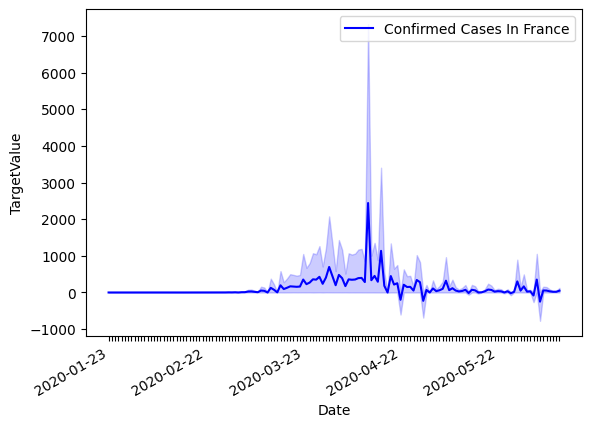

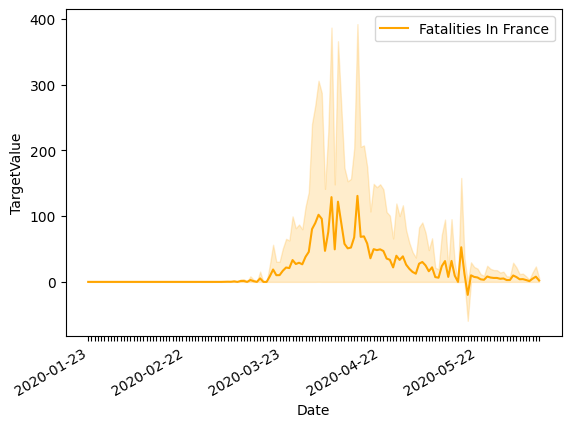

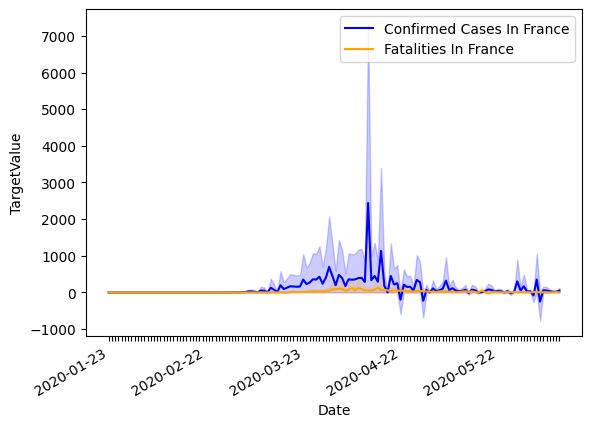

In [11]:
plot_date_to_target_value("France")

## Missing data handling

Missing data:
Id                    0
County            89600
Province_State    52360
Country_Region        0
Population            0
Weight                0
Date                  0
Target                0
TargetValue           0
dtype: int64 
NaN values = 141960

Variable County has 89600 records (9.24%) with missing values.
Variable Province_State has 52360 records (5.40%) with missing values.
In total, there are 2 variables with missing values


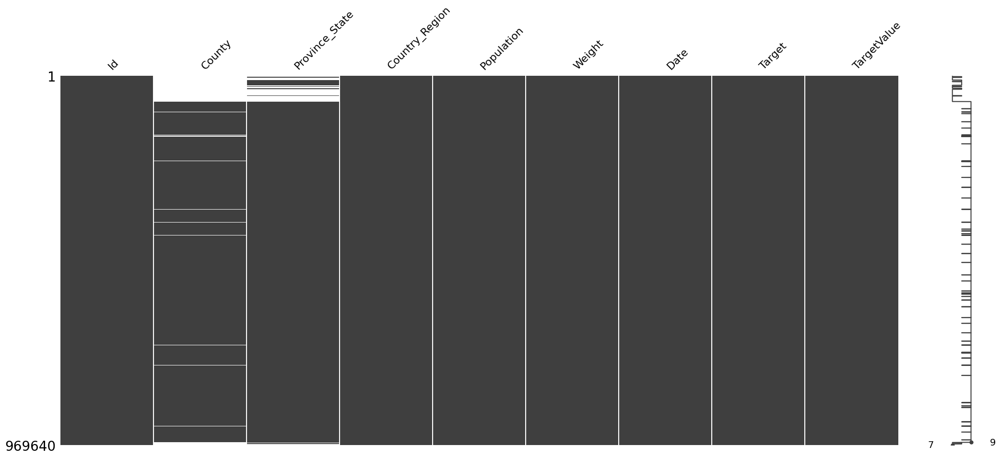

In [12]:
def check_missing_values():
    print("Missing data:\n{} ".format(train_df.isna().sum()))
    msno.matrix(train_df)
    print('NaN values =', train_df.isnull().sum().sum())
    print("""""")
    vars_with_missing = []
    for feature in train_df.columns:
        missings = train_df[feature].isna().sum()
        if missings > 0 :
            vars_with_missing.append(feature)
            missings_perc = missings / train_df.shape[0]
            print('Variable {} has {} records ({:.2%}) with missing values.'.format(feature, missings, missings_perc))
    print('In total, there are {} variables with missing values'.format(len(vars_with_missing)))
    
check_missing_values()

Observations:
- Dataset is almost free of missing data
- 2 columns which have missing data are "County" and "Province_State"
- Since we are going to do forecasing for Countries, we do not need information about Province States or Counties. Due to that fact, we will drop rows with values in those columns in order to keep information only about entire Countires (if Country has information about its Counties or States, it also has information about entire country in separate rows where County or Province State values are "NANs"
- After removing rows with values inside those columns, we will drop those columns entirely since there will be no data at all

### Drop Province_State rows which are not NAN and column

In [13]:
province_state = train_df[train_df['Province_State'].notnull()]
pd.unique(province_state['Country_Region'])

array(['Australia', 'Canada', 'China', 'Denmark', 'France', 'Netherlands',
       'US', 'United Kingdom'], dtype=object)

In [14]:
cond = train_df['Province_State'].isin(province_state['Province_State'])
train_df.drop(train_df[cond].index, inplace = True)

In [15]:
pd.unique(train_df['Province_State'])

array([nan], dtype=object)

In [16]:
#drop Province_state column
train_df = train_df.drop(['Province_State'],axis = 1)

### Drop County rows which are not NAN and column

In [17]:
county = train_df[train_df['County'].notnull()]
pd.unique(county["County"])

array([], dtype=object)

In [18]:
cond = train_df['County'].isin(county['County'])
train_df.drop(train_df[cond].index, inplace = True)

In [19]:
pd.unique(train_df['County'])

array([nan], dtype=object)

In [20]:
#drop Province_state column
train_df = train_df.drop(['County'],axis = 1)

### Add column "Continents" and assign Countries to Continents

In [21]:
continents = {
    "Africa": ["Angola", "Algeria", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cabo Verde", "Cameroon", "Central African Republic", "Chad", "Comoros", "Congo (Brazzaville)", 
               "Congo (Kinshasa)", "Cote d'Ivoire", "Djibouti", "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea", 
               "Guinea-Bissau", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali", 
               "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe", "Senegal",
               "Seychelles", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia", "Uganda","Western Sahara", "Zambia", "Zimbabwe"],
    "Asia": ["Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan", "Brunei", "Cambodia", "China", "Cyprus", "Georgia", "India", 
             "Indonesia", "Iran", "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan", "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", "Malaysia", "Maldives", 
             "Mongolia", "Burma", "Nepal", "North Korea", "Oman", "Pakistan", "Palestine", "Philippines", "Qatar", "Russia", "Saudi Arabia", 
             "Singapore", "Korea, South", "Sri Lanka", "Syria", "Taiwan*", "Tajikistan", "Thailand", "Timor-Leste", "Turkey", "Turkmenistan", "United Arab Emirates", 
             "Uzbekistan", "Vietnam", "Yemen","West Bank and Gaza"],
    "Europe": ["Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Czechia", "Denmark", "Estonia", 
               "Finland", "France", "Germany", "Greece", "Hungary", "Iceland", "Ireland", "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", 
               "Malta", "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland", "Portugal", "Romania", "San Marino", "Serbia", 
               "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine", "United Kingdom","Holy See"],
    "North America": ["Antigua and Barbuda", "Bahamas", "Barbados", "Belize", "Canada", "Costa Rica", "Cuba", "Dominica", "Dominican Republic", 
                          "El Salvador", "Grenada", "Guatemala", "Haiti", "Honduras", "Jamaica", "Mexico", "Nicaragua", "Panama", "Saint Kitts and Nevis", 
                          "Saint Lucia", "Saint Vincent and the Grenadines", "Trinidad and Tobago", "US"],
    "South America": ["Argentina", "Bolivia", "Brazil", "Chile", "Colombia", "Ecuador", "Guyana", "Paraguay", "Peru", "Suriname", "Uruguay", "Venezuela"],
    "Oceania": ["Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru", "New Zealand", "Palau", "Papua New Guinea", "Samoa", 
                "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu"]
}
def assign_continent (row):
    # Check the value of the 'Country_Region' column
    if row["Country_Region"] in continents['Africa']:
        return 'Africa'
    if row["Country_Region"] in continents['North America']:
        return 'North America'
    if row["Country_Region"] in continents['South America']:
        return 'South America'
    if row["Country_Region"] in continents['Oceania']:
        return 'Oceania'
    if row["Country_Region"] in continents['Europe']:
        return 'Europe'
    if row["Country_Region"] in continents['Asia']:
        return 'Asia'
        
train_df['Continents'] = train_df.apply (lambda row: assign_continent(row), axis=1)

In [22]:
train_df.head()

,Id,Country_Region,Population,Weight,Date,Target,TargetValue,Continents
0,1,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0,Asia
1,2,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0,Asia
2,3,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0,Asia
3,4,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0,Asia
4,5,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0,Asia


Missing data:
Id                  0
Country_Region      0
Population          0
Weight              0
Date                0
Target              0
TargetValue         0
Continents        560
dtype: int64 
NaN values = 560

Variable Continents has 560 records (1.07%) with missing values.
In total, there are 1 variables with missing values


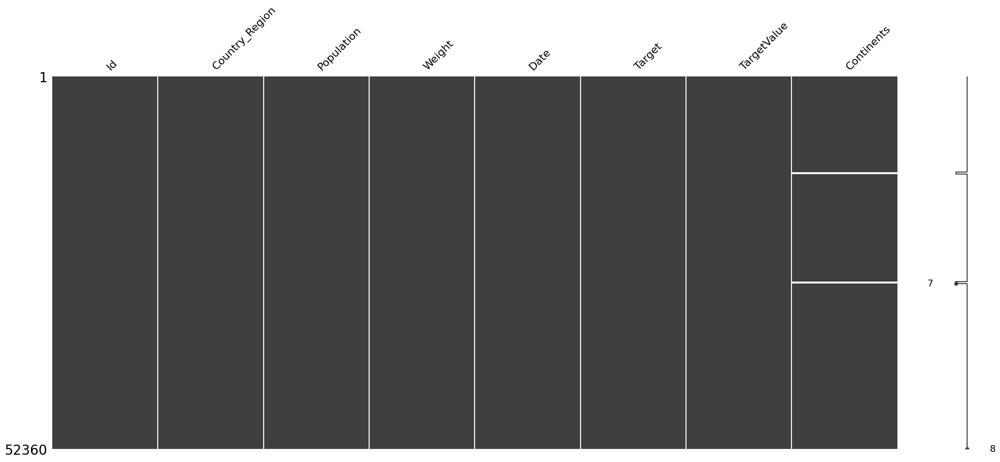

In [23]:
check_missing_values()

In [24]:
null = train_df[train_df['Continents'].isnull()]
pd.unique(null['Country_Region'])

array(['Diamond Princess', 'MS Zaandam'], dtype=object)

Observation:
- 2 variables have not been assigned to any continents because they are actually ships. They are going to be dropped since they are not countries.

In [25]:
train_df.drop(train_df[train_df['Country_Region'] == "MS Zaandam"].index, inplace = True)
train_df.drop(train_df[train_df['Country_Region'] == "Diamond Princess"].index, inplace = True)

Missing data:
Id                0
Country_Region    0
Population        0
Weight            0
Date              0
Target            0
TargetValue       0
Continents        0
dtype: int64 
NaN values = 0

In total, there are 0 variables with missing values


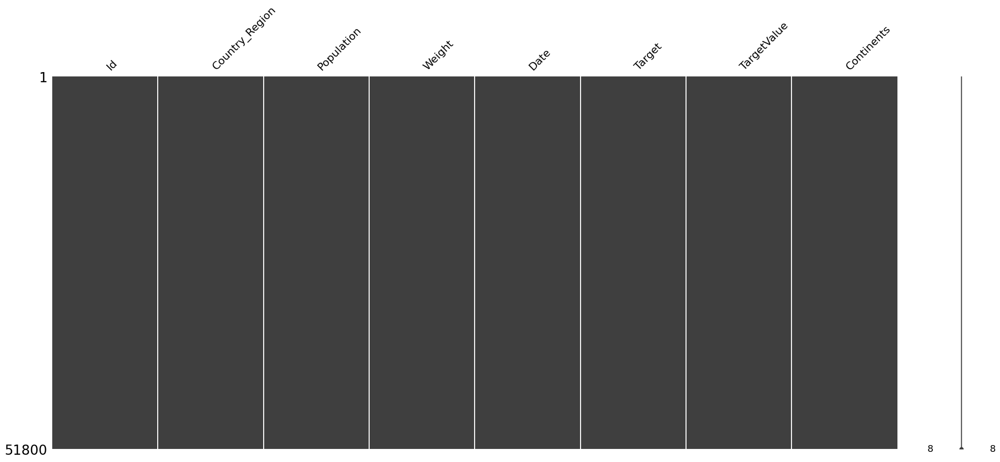

In [26]:
check_missing_values()

After dropping ships we have **dataset free of missing values**

### Final dataset shape after missing data handling

In [27]:
train_df.head()

,Id,Country_Region,Population,Weight,Date,Target,TargetValue,Continents
0,1,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0,Asia
1,2,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0,Asia
2,3,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0,Asia
3,4,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0,Asia
4,5,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0,Asia


In [28]:
train_df.shape

(51800, 8)

## Confirmed cases and fatalities combined in each country

In [29]:
fig= plt.figure(figsize=(45,30))
fig= px.pie(train_df, names= 'Country_Region', values= 'TargetValue', color_discrete_sequence= px.colors.sequential.RdBu, hole= 0.4)
fig.update_traces(textposition = 'inside')

fig.show()

<Figure size 4500x3000 with 0 Axes>

In [30]:
#Top 10 populous countires
grouped_data= train_df.groupby('Country_Region').sum()
top_10_pop_countries= grouped_data.nlargest(10,'Population')['TargetValue']
top_10_pop_countries

Country_Region
China           88282
India          284328
US            2113201
Indonesia       36275
Brazil         812096
Pakistan       115957
Nigeria         14255
Bangladesh      75877
Russia         499373
Japan           18066
Name: TargetValue, dtype: int64

In [31]:
fig = px.bar(x= top_10_pop_countries.index, y= top_10_pop_countries.values, title= 'top 10 populous countries vs number of covid cases', labels= dict(x= 'Countries', y='number of covid cases'))
fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})
fig.show()

In [32]:
date_grouped_data= train_df.groupby('Date').sum()

fig = px.line(x= date_grouped_data.index, y= date_grouped_data['TargetValue'], title= 'growth of covid cases over time', labels= dict( x='Date', y='Number of covid cases'))
fig.show()

## Population in each Continent

In [33]:
one_row_for_country = train_df.groupby('Country_Region').nth(0)

In [34]:
continent_population = one_row_for_country.groupby("Continents")["Population"].sum()
sum_continent_population = continent_population.to_frame()
sum_continent_population['Continents'] = sum_continent_population.index

In [35]:
sum_continent_population

,Population,Continents
Continents,,
Africa,1182762438,Africa
Asia,4489942209,Asia
Europe,598879750,Europe
North America,568607922,North America
Oceania,39008216,Oceania
South America,418349705,South America


In [36]:
fig = px.histogram(data_frame = sum_continent_population, 
             x = 'Continents', 
             y= 'Population', )
fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})

**Observations:**
- Asia has the biggest population 
- Africa is on the second place
- Europe, North and South America have very similar population


## Mean of fatalities per day 

In [37]:
fatalities = train_df[train_df["Target"] == "Fatalities"]

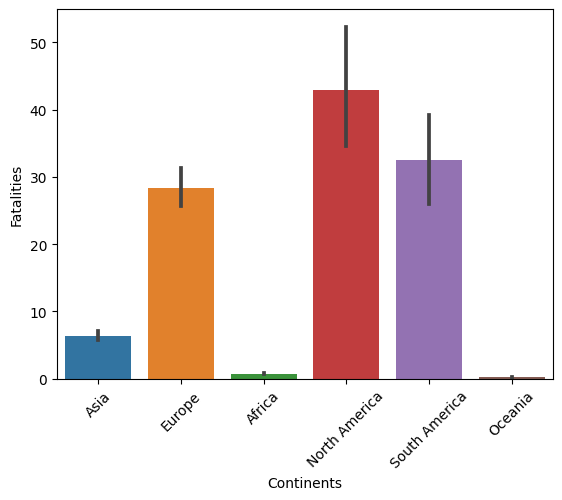

In [38]:
# Create a bar plot to compare the relative proportions of ConfirmedCases and Fatalities for different countries
ax = sns.barplot(x="Continents",y="TargetValue", data=fatalities,)
ax.set(ylabel='Fatalities')
plt.xticks(rotation=45)
plt.show()

### Sum of fatalities per continent

In [39]:
fig = px.histogram(data_frame = fatalities, 
                   x = 'Continents', 
                   y = 'TargetValue', 
                   labels={"TargetValue": "Fatalities"})
fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})
fig.show()

Observations:
- Most daily confirmed cases happened in North America which was around 41
- Most of the Fatalities happened in Europe and North America


### Mean of Confirmed Cases per day

In [40]:
confirmed_cases = train_df[train_df["Target"] == "ConfirmedCases"]

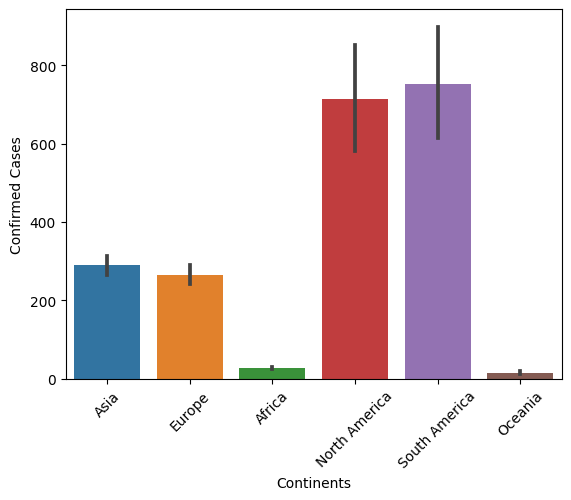

In [41]:
# Create a bar plot to compare the relative proportions of ConfirmedCases and Fatalities for different countries
ax = sns.barplot(x="Continents",y="TargetValue", data=confirmed_cases)
ax.set(ylabel='Confirmed Cases')
plt.xticks(rotation=45)
plt.show()

### Sum of Confirmed Cases per continent

In [42]:
fig = px.histogram(data_frame = confirmed_cases, 
             x = 'Continents', 
             y = 'TargetValue',
             labels={"TargetValue": "Confirmed Cases"})
fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})
fig.show()

Observations:
- Most daily Confirmed Cases happened in North and South America which was around 700 cases per day
- Most of the Confirmed Cases happened in North America. Sum of Confirmed Cases is actually well distributed across almost all continents (Africa is behind probably due to not well developed health care and because of that, not enough testing)


## Confirmed Cases and Fatalities in Continents

In [43]:
# plot_date_to_target_value function tweaked in order to work with continents

# Function which will create 3 charts about chosen continent
# It will show the amount of fatalities and confirmed cases which happened in specific country

def plot_date_to_target_value_continent(country_name):
    
    country = train_df.loc[train_df['Continents'] == country_name]
    fatalities = country[country["Target"] == "Fatalities"]
    confirmed_cases = country[country["Target"] == "ConfirmedCases"]

    # Create a line plot to visualize the number of confirmed cases over time
    ax = sns.lineplot(x="Date", y="TargetValue",data=confirmed_cases, color="blue", label=f"Confirmed Cases In {country_name}") 
    n = 30  # Keeps every 30th label
    [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]
    plt.gcf().autofmt_xdate()
    plt.show()
    
    # Create a line plot to visualize the number of fatalities over time
    ax = sns.lineplot(x="Date", y="TargetValue",data=fatalities, color="orange", label=f"Fatalities In {country_name}") 
    n = 30  # Keeps every 30th label
    [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]
    plt.gcf().autofmt_xdate()
    plt.show()
    
    # Create a line plot to visualize the number of confirmed cases and fatalities over time
    ax = sns.lineplot(x="Date", y="TargetValue",data=confirmed_cases, color="blue", label=f"Confirmed Cases In {country_name}") 
    sns.lineplot(x="Date", y="TargetValue",data=fatalities, color="orange", label=f"Fatalities In {country_name}") 
    n = 30  # Keeps every 7th label
    [l.set_visible(False) for (i,l) in enumerate(ax.xaxis.get_ticklabels()) if i % n != 0]
    plt.gcf().autofmt_xdate()
    plt.show()

['Asia' 'Europe' 'Africa' 'North America' 'South America' 'Oceania']


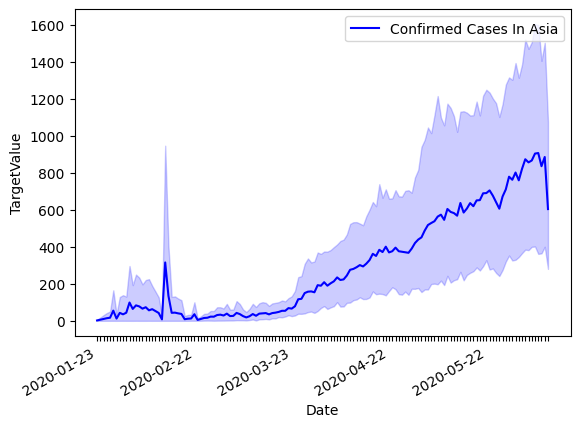

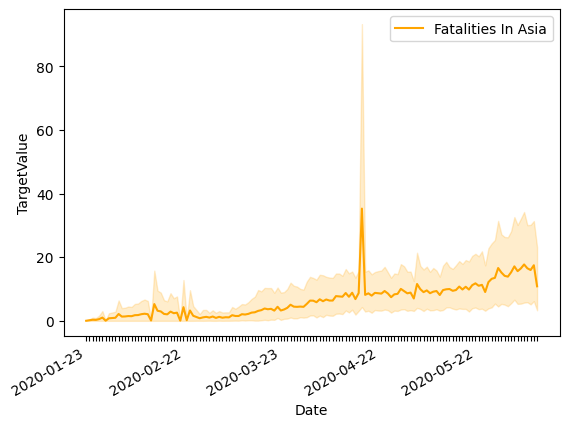

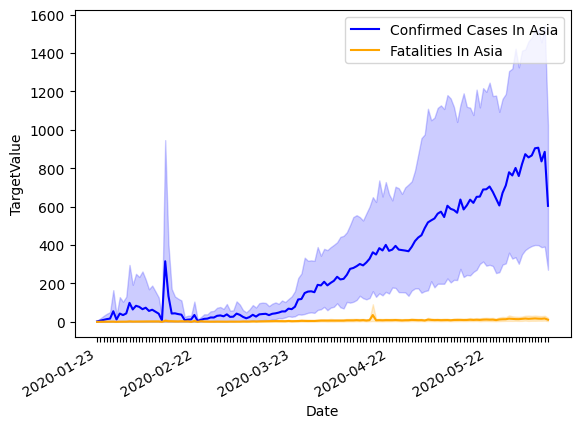

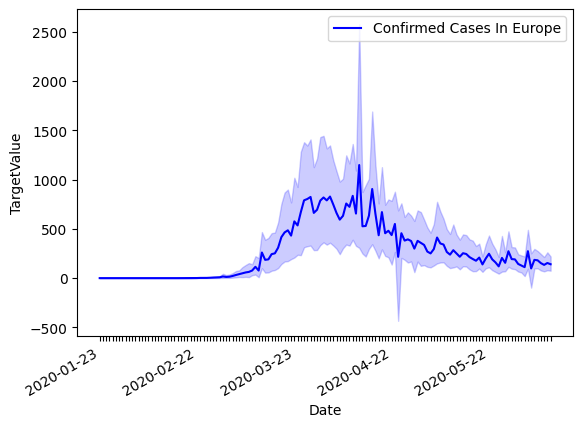

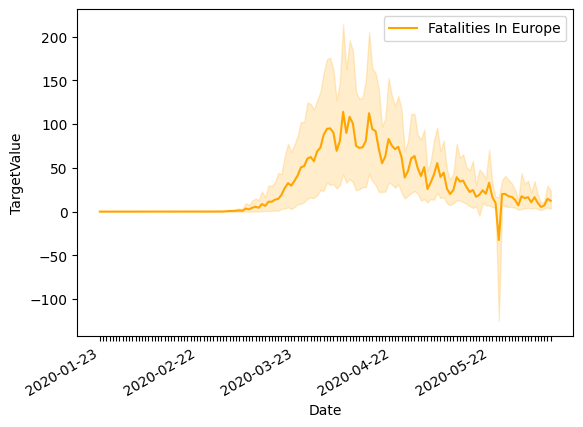

...

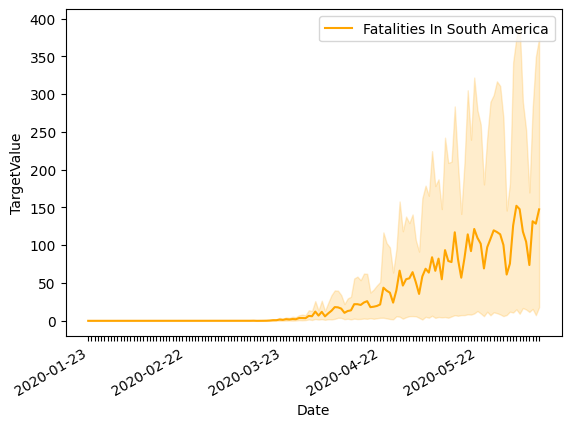

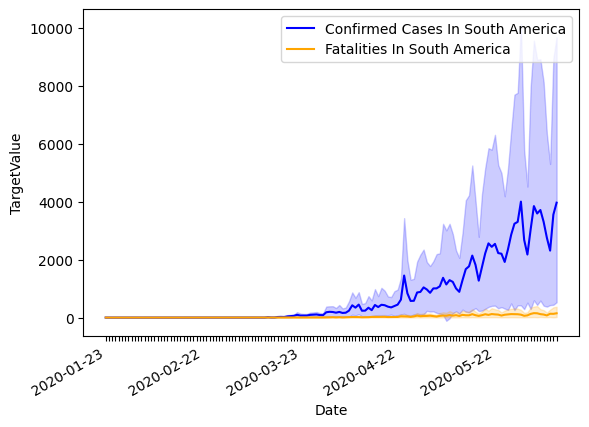

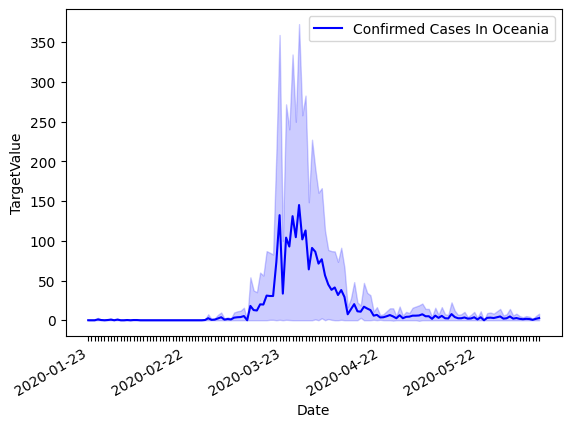

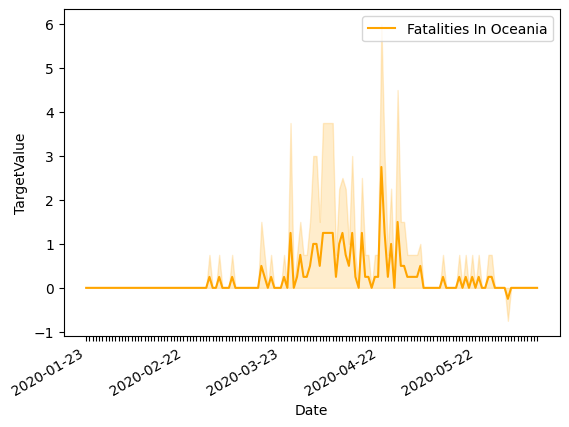

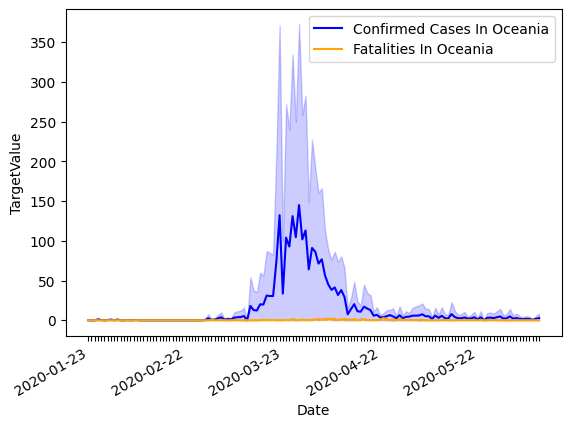

In [44]:
def plot_continent_line():
    continents = train_df['Continents'].unique()
    print(continents)
    for continent in continents:
        plot_date_to_target_value_continent(continent)  

plot_continent_line()

In [45]:
def recovering_country(continent):
    countries = train_df[train_df["Continents"] == continent]
    fig = px.histogram(data_frame = countries, 
                 x = 'Country_Region', 
                 y= 'TargetValue')
    fig.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})
    fig.show()

In [46]:
recovering_country("Europe")

In [47]:
recovering_country("Oceania")

Observations:
- From the trend we can clearly tell that only European countries are doing well on taking preventive measure and keeping covid in check.

- Asian countries were struck first by the COVID, we can find gradual increase in confirmed cases for first few months. Then the number of cases started to grow rapidly after March. Same goes with the trend in fatalities, we can find slight increase in rate of fatalities every month.

- Second comes North America where the case started showing up late February where number of confirmed cases and fatalities both skyrocketed overnight, reaching almost 4000 number of confirmed cases and almost 500 number of fatalities rate within a month. Although the rate was growing exponentially throughout the recorded year, we can find slight decrease in numbers for both confirmed cases and fatalities

- South America also got hit late by COVID, however there is no sign of stopping for it. The trend still seems troublesome as there is no sign of decrease in numbers

- Africa has a very gradual increment in the casualty numbers throughout the time. Initially there were very few number of confirmed cases and fatalities, but the number kept on increasing since then.

- Oceanic is the only country with the data of super recovery. Althought the contry got introduced to the COVID a lot earlier than North and South American, it was able to recover from it quick within approx 6 months. Although the small number of cases still exists, this is the only country with lower number of confirmed cases and fatalities.

- Europe however also has an interesting record, Europe was one of the continent which got struck by COVID in around first 2 weeks of February, although the cases reached a massive number of almost 2500 they were successful on keeping those number down by following essential preventive measures and precautions. The number is as low as other oceanic countries out there.

- Among all the countries it appears that countires from Oceania continent does have significantly low fatalities and confirmed cases ( as per record ).

- There might be various factor affecting the result as well. However according to record Oceania has lowest fatalities and confirmed cases.


## World Visualization

In [48]:
fig = px.treemap(train_df, values='TargetValue',
                 path = ['Country_Region'], color='Weight',
                 hover_data=['Country_Region'],
                 color_continuous_scale='matter',
                 title='Worldwide COVID-19 Confirmed Cases and Fatalities weight')
fig.show()

Observations:
- West Europe has the biggest Confirmed Cases and Fatalities ratio to population which gives them the higher weight compared to the rest of the world

- South America seems to have second biggest Confirmed Cases and Fatalities ratio to population

In [49]:
fatalities = train_df.loc[train_df['Target'] == "Fatalities"]
confirmed_cases = train_df.loc[train_df['Target'] == "ConfirmedCases"]

In [50]:
# Get the codes for the whole world so we can display the countries
country_codes = pd.read_csv('2014_world_gdp_with_codes.csv')
# Get only the necessary columns from the dataset - Code and Country
country_codes = country_codes[['CODE', 'COUNTRY']]
# Rename columns so they match with the COVID dataset
country_codes.rename(columns={'CODE': 'Code', 'COUNTRY': 'Country_Region'}, inplace=True)
# Fix the discrepancy countries so all of the data is displayed on the map
country_codes.loc[country_codes['Country_Region'] == 'United States', 'Country_Region'] = 'US'
country_codes.loc[country_codes['Country_Region'] == 'Congo, Democratic Republic of the', 'Country_Region'] = 'Congo (Kinshasa)'
country_codes.loc[country_codes['Country_Region'] == 'Congo, Republic of the', 'Country_Region'] = 'Congo (Brazzaville)'
country_codes.loc[country_codes['Country_Region'] == 'Macedonia', 'Country_Region'] = 'North Macedonia'
country_codes.loc[country_codes['Country_Region'] == 'Czech Republic', 'Country_Region'] = 'Czechia'

In [51]:
def target_value_map(dataset, colorbar_title=str):
    
    # Get the TargetValue sum for every country
    country_target_values = dataset.groupby('Country_Region', as_index=False)['TargetValue'].sum()
    country_target_values = country_codes.merge(country_target_values)

    # Visualize the world map
    fig = go.Figure(data=go.Choropleth(
        locations = country_target_values['Code'],
        z = country_target_values['TargetValue'],
        text = country_target_values['Country_Region'],
        colorscale = 'portland',
        marker_line_width=0.5,
        colorbar_title = colorbar_title,
    ))
    fig.update_layout(
        title_text=f'COVID-19 {colorbar_title} world map',
        geo=dict(
            showframe=True,
            showcoastlines=False,
        )    
    )
    fig.show()
    

In [52]:
target_value_map(confirmed_cases, "Confirmed Cases")

In [53]:
target_value_map(fatalities, "Fatalities")

Observations:
- **USA has the highest amount** of Confirmed Cases as well as Fatalities
- When looking at Europe, we can see that in terms of **Confirmed Cases, it does not stand out from the rest of the countries**, but when looking at fatalities, we can see the difference which is **higher number of Fatalities in West Europe compared to the neighboring countries**
- Brazil also stands out when compared to the neighboring countries

## First confirmed cases + Timeframes

In [54]:
# First confirmed cases
chronological_cases = train_df.loc[ (train_df['TargetValue'] > 0) & (train_df['Target'] == 'ConfirmedCases')  ]
chronological_cases = chronological_cases.sort_values(by=['Date'])
chronological_cases.head(5)

,Id,Country_Region,Population,Weight,Date,Target,TargetValue,Continents
24920,24921,China,1395773400,0.047491,2020-01-23,ConfirmedCases,95,Asia
61600,61601,Singapore,5535000,0.064406,2020-01-23,ConfirmedCases,1,Asia
66080,66081,Thailand,65327652,0.055571,2020-01-23,ConfirmedCases,1,Asia
967960,967961,Vietnam,92700000,0.054511,2020-01-23,ConfirmedCases,2,Asia
61602,61603,Singapore,5535000,0.064406,2020-01-24,ConfirmedCases,2,Asia


In [55]:
# First confirmed fatalities:
chronological_cases1 = train_df.loc[ (train_df['TargetValue'] > 0) & (train_df['Target'] == 'Fatalities')  ]
chronological_cases1 = chronological_cases1.sort_values(by=['Date'])
chronological_cases1.head(5)

,Id,Country_Region,Population,Weight,Date,Target,TargetValue,Continents
24921,24922,China,1395773400,0.474908,2020-01-23,Fatalities,1,Asia
24923,24924,China,1395773400,0.474908,2020-01-24,Fatalities,8,Asia
24925,24926,China,1395773400,0.474908,2020-01-25,Fatalities,16,Asia
24927,24928,China,1395773400,0.474908,2020-01-26,Fatalities,14,Asia
24929,24930,China,1395773400,0.474908,2020-01-27,Fatalities,26,Asia


In [56]:
len(train_df["Date"].unique())

140

**We may want to split the dataset by dates, to then see how the virus spread. There are 140 unique days in total in this dataset. In this case, we can use the 2/5/10/20/35/70 day intervals. We will use the 20 days intervals**

In [57]:
timed = train_df

As we checked earlier, each country has 280 rows assigned to itself. 

In [58]:
# Timeframe will be used to assign timeframes.
timed['Timeframe'] = np.nan
timed

,Id,Country_Region,Population,Weight,Date,Target,TargetValue,Continents,Timeframe
0,1,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0,Asia,NaN
1,2,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0,Asia,NaN
2,3,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0,Asia,NaN
3,4,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0,Asia,NaN
4,5,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0,Asia,NaN
...,...,...,...,...,...,...,...,...,...
969635,969636,Zimbabwe,14240168,0.607106,2020-06-08,Fatalities,0,Africa,NaN
969636,969637,Zimbabwe,14240168,0.060711,2020-06-09,ConfirmedCases,27,Africa,NaN
969637,969638,Zimbabwe,14240168,0.607106,2020-06-09,Fatalities,0,Africa,NaN
969638,969639,Zimbabwe,14240168,0.060711,2020-06-10,ConfirmedCases,6,Africa,NaN


In [59]:
# This code will create an array of unique dates, split them into 7 arrays (timeframes) and then compare them to the dates that are in the timed dataframe. 
# During comparison, for the array[n], it will receive the timeframe[n+1]
arr = train_df["Date"].unique()
#splitting dates into 7 timeframes
split_dates = np.array_split(arr, 7)

In [60]:
for index, row in timed.iterrows():
        if timed["Date"][index] in split_dates[0]:
            timed['Timeframe'][index] = 1
        if timed["Date"][index] in split_dates[1]:
            timed['Timeframe'][index] = 2
        if timed["Date"][index] in split_dates[2]:
            timed['Timeframe'][index] = 3
        if timed["Date"][index] in split_dates[3]:
            timed['Timeframe'][index] = 4
        if timed["Date"][index] in split_dates[4]:
            timed['Timeframe'][index] = 5
        if timed["Date"][index] in split_dates[5]:
            timed['Timeframe'][index] = 6
        if timed["Date"][index] in split_dates[6]:
            timed['Timeframe'][index] = 7
        

In [61]:
timed["Timeframe"].unique()

array([1., 2., 3., 4., 5., 6., 7.])

Observations:
- Data starts at *2020-01-23* and ends at *2020-06-10*
- The timeframes can be utilized to visualise covid in smaller chunks

# Finding the recovery value of the dataset

In [62]:
#Filter dataset into two separate datasets. One for Cases and One for Fatalities. 
#chronological_cases string taken from Kacper Gondek's "First confirmed cases + Timeframes" section of the code

fatal = chronological_cases1.filter(['Country_Region','Target','TargetValue'], axis=1)
CC = chronological_cases.filter(['Country_Region','Target','TargetValue'], axis=1)

Print dataset targeting only country/target/targetvalues

In [63]:
CC

fatal

,Country_Region,Target,TargetValue
24921,China,Fatalities,1
24923,China,Fatalities,8
24925,China,Fatalities,16
24927,China,Fatalities,14
24929,China,Fatalities,26
...,...,...,...
30799,El Salvador,Fatalities,4
1959,Argentina,Fatalities,18
30519,Egypt,Fatalities,36
41719,Ireland,Fatalities,4


Grouping target value per country

Grouping Confirmed cases

In [64]:
one_row_for_CC = CC.groupby('Country_Region').nth(0)
CC_population = one_row_for_CC.groupby("Country_Region")["TargetValue"].sum()
sum_CC_population = CC_population.to_frame()
sum_CC_population['Country_Region'] = sum_CC_population.index
sum_CC_population

,TargetValue,Country_Region
Country_Region,,
Afghanistan,1,Afghanistan
Albania,2,Albania
Algeria,1,Algeria
Andorra,1,Andorra
Angola,1,Angola
...,...,...
West Bank and Gaza,4,West Bank and Gaza
Western Sahara,4,Western Sahara
Yemen,1,Yemen


Grouping Fatalities

In [65]:
one_row_for_fatal = fatal.groupby('Country_Region').nth(0)
fatal_population = one_row_for_fatal.groupby("Country_Region")["TargetValue"].sum()
sum_fatal_population = fatal_population.to_frame()
sum_fatal_population['Country_Region'] = sum_fatal_population.index
sum_fatal_population

,TargetValue,Country_Region
Country_Region,,
Afghanistan,1,Afghanistan
Albania,1,Albania
Algeria,1,Algeria
Andorra,1,Andorra
Angola,2,Angola
...,...,...
West Bank and Gaza,1,West Bank and Gaza
Western Sahara,1,Western Sahara
Yemen,2,Yemen


Finding the recovery value by subtracting group cases by fatalities

In [66]:
recovery = sum_CC_population.set_index('Country_Region').subtract(sum_fatal_population.set_index('Country_Region'))
recovery.rename ({'TargetValue': 'Recovery'}, axis=1, inplace=True)
recovery

,Recovery
Country_Region,
Afghanistan,0.0
Albania,1.0
Algeria,0.0
Andorra,0.0
Angola,-1.0
...,...
West Bank and Gaza,3.0
Western Sahara,3.0
Yemen,-1.0


Sorting the graph to see which country is recovering the most from Covid

In [67]:
recovery.sort_values(by=['Recovery'],ascending=False)
recovery['Country_Region'] = recovery.index
recovery

,Recovery,Country_Region
Country_Region,,
Afghanistan,0.0,Afghanistan
Albania,1.0,Albania
Algeria,0.0,Algeria
Andorra,0.0,Andorra
Angola,-1.0,Angola
...,...,...
West Bank and Gaza,3.0,West Bank and Gaza
Western Sahara,3.0,Western Sahara
Yemen,-1.0,Yemen


The united states has the highest recovery out of every country. Countries with values with less than zero will be replaced as nan.

First to reset the index to align the columns

In [68]:
recovery.reset_index

<bound method DataFrame.reset_index of                     Recovery      Country_Region
Country_Region                                  
Afghanistan              0.0         Afghanistan
Albania                  1.0             Albania
Algeria                  0.0             Algeria
Andorra                  0.0             Andorra
Angola                  -1.0              Angola
...                      ...                 ...
West Bank and Gaza       3.0  West Bank and Gaza
Western Sahara           3.0      Western Sahara
Yemen                   -1.0               Yemen
Zambia                   1.0              Zambia
Zimbabwe                 0.0            Zimbabwe

[185 rows x 2 columns]>

Plotting bar and tree graphs of the recovery value of each country

In [69]:
recoverbar = px.bar(recovery, x="Country_Region", y="Recovery", color="Recovery", title="Recovery rate of each country")
recoverbar.update_layout(barmode='stack', xaxis={'categoryorder': 'total descending'})
recoverbar.show()

In [70]:
recovertree = px.treemap(recovery, path=['Country_Region'],values='Recovery',title="Recovery rate of each country in treemap", width=800, height=400)
recovertree.update_layout(margin = dict(t=50, l=25, r=25, b=25))
recovertree.show()

In [71]:
recoverpie = px.pie(recovery, values='Recovery', names='Country_Region', title='Recovery rate of each country pie chart')
recoverpie.update_traces(textposition='inside', textinfo='percent+label')
recoverpie.show()

**Observations:**

- As seen on the different data plots, USA clearly has more recovery than any other country with China in second and Kosovo in third.

# Data preparation

In [72]:
# Modify dates into numbers in order to make it suitable for modeling
train_df["Date"] = pd.to_datetime(train_df["Date"]).dt.strftime("%m%d").astype(int)


In [73]:
# Encode categorical values into numbers to make it suitable for modeling
from sklearn.preprocessing import LabelEncoder 
  
le = LabelEncoder()   
train_df['Country_Region']= le.fit_transform(train_df['Country_Region']) 
train_df['Target']= le.fit_transform(train_df['Target'])


In [74]:
train_df.shape


(51800, 9)

# Model Fitting

In [77]:
import pandas as pd
import dabl
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_digits

X, y = load_digits(return_X_y=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
sc = dabl.SimpleClassifier().fit(X_train, y_train)

print(f"\nAccuracy score {sc.score(X_test, y_test)*100}%")


Running DummyClassifier()
accuracy: 0.106 recall_macro: 0.100 precision_macro: 0.011 f1_macro: 0.019
=== new best DummyClassifier() (using recall_macro):
accuracy: 0.106 recall_macro: 0.100 precision_macro: 0.011 f1_macro: 0.019

Running GaussianNB()
accuracy: 0.834 recall_macro: 0.834 precision_macro: 0.846 f1_macro: 0.835
=== new best GaussianNB() (using recall_macro):
accuracy: 0.834 recall_macro: 0.834 precision_macro: 0.846 f1_macro: 0.835

Running MultinomialNB()
accuracy: 0.904 recall_macro: 0.905 precision_macro: 0.909 f1_macro: 0.905
=== new best MultinomialNB() (using recall_macro):
accuracy: 0.904 recall_macro: 0.905 precision_macro: 0.909 f1_macro: 0.905

Running DecisionTreeClassifier(class_weight='balanced', max_depth=1)
accuracy: 0.196 recall_macro: 0.199 precision_macro: 0.076 f1_macro: 0.099
Running DecisionTreeClassifier(class_weight='balanced', max_depth=10)
accuracy: 0.819 recall_macro: 0.820 precision_macro: 0.825 f1_macro: 0.818
Running DecisionTreeClassifier(clas

In [78]:
# Define a function to compute the evaluation metrics
def evaluate_model(model, X_val, y_val):
    y_pred = model.predict(X_val)
    mae = mean_absolute_error(y_val, y_pred)
    mse = mean_squared_error(y_val, y_pred)
    rmse = np.sqrt(mse) 
    r2 = r2_score(y_val, y_pred)
    return mae, mse, rmse, r2

X, y = load_digits(return_X_y=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

models = [LinearRegression(), 
          SVR(), 
          RandomForestRegressor(n_estimators=100)
         ]

param_grids = [{}, 
               {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf', 'poly']}, 
               {'n_estimators': [50, 100, 200]}
              ]

results = []

for model, param_grid in zip(models, param_grids):
    gs = GridSearchCV(model, param_grid, cv=5)
    gs.fit(X_train, y_train)
    model = gs.best_estimator_
    cv_results = cross_val_score(model, X_train, y_train, cv=5)
    mae, mse, rmse, r2 = evaluate_model(model, X_test, y_test)
    results.append({'model': model.__class__.__name__,
                    'best_params': gs.best_params_,
                    'cv_mean': cv_results.mean(),
                    'cv_std': cv_results.std(),
                    'mae': mae,
                    'mse': mse,
                    'rmse': rmse,
                    'r2': r2
})

#Store the results in a DataFrame
df = pd.DataFrame(results, columns=['model', 'best_params', 'cv_mean', 'cv_std', 'mae', 'mse', 'rmse', 'r2'])

#Print the results
print(df)

                   model                 best_params   cv_mean    cv_std  \
0       LinearRegression                          {}  0.561914  0.011656   
1                    SVR  {'C': 10, 'kernel': 'rbf'}  0.922960  0.011040   
2  RandomForestRegressor       {'n_estimators': 100}  0.860411  0.017944   

        mae       mse      rmse        r2  
0  1.437593  3.419348  1.849148  0.564095  
1  0.489631  0.494223  0.703010  0.936996  
2  0.590056  0.991366  0.995674  0.873619  


In [79]:
# Define the pipeline classes
LogisticRegressionPipeline = Pipeline([('logistic_regression', LogisticRegression())])
DecisionTreePipeline = Pipeline([('decision_tree', DecisionTreeClassifier())])
RandomForestPipeline = Pipeline([('random_forest', RandomForestClassifier())])
KNeighborsClassifierPipeline = Pipeline([('k_neighbors', KNeighborsClassifier())])
SupportVectorMachinePipeline = Pipeline([('support_vector_machine', SVC())])

# Define the list of pipelines
ourpipeline = [LogisticRegressionPipeline, DecisionTreePipeline, RandomForestPipeline, KNeighborsClassifierPipeline, SupportVectorMachinePipeline]

# Set initial values for accuracy, classifier, and pipeline
accuracy = 0.0
classifier = 0
pipeline = ""

# Create a dictionary of pipelines and their corresponding names
pipeline_dict = {0: 'Logistic Regression', 1: 'Decision Tree', 2: 'Random Forest', 3: 'KNN', 4: 'SVC'}

# Fit the pipelines
for ourpipe in ourpipeline:
    ourpipe.fit(X_train, y_train)

# Get test accuracy for all classifiers
for i, model in enumerate(ourpipeline):
    print("{} Test Accuracy: {}".format(pipeline_dict[i], model.score(X_test, y_test)*100))

# Choose the best model for the given data 
for i, model in enumerate(ourpipeline):
    if model.score(X_test, y_test) > accuracy:
        pipeline = model
        classifier = i
print("\nClassifier with best accuracy: {}".format(pipeline_dict[classifier]))

Logistic Regression Test Accuracy: 96.38888888888889
Decision Tree Test Accuracy: 85.0
Random Forest Test Accuracy: 97.22222222222221
KNN Test Accuracy: 99.72222222222223
SVC Test Accuracy: 98.33333333333333

Classifier with best accuracy: SVC
